In [669]:
import pandas as pd
from tqdm import tqdm
import os

import matplotlib as plt
import sqlalchemy as sa
from sqlalchemy import Table, MetaData, Column, Integer, text

import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import glob
%matplotlib inline
p = sns.color_palette()

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)
import warnings
warnings.filterwarnings("ignore")

In [670]:
os.environ['AZURE_MSDS432_USERNAME']='azureuser'

In [671]:
os.environ['AZURE_MSDS432_PASSWORD']='msds432!'

In [672]:
username = os.getenv('AZURE_MSDS432_USERNAME')
password = os.getenv('AZURE_MSDS432_PASSWORD')
host = 'mysqlserver-432.database.windows.net'
database = 'mySampleDatabase'
authentication = "SqlPassword"
conn_string = sa.engine.url.URL.create(
     "mssql+pyodbc",
     username=username,
     password=password,
     host=host,
     port=1433,
     database=database,
     query={"driver": "ODBC Driver 18 for SQL Server", "authentication": authentication}
 )

engine = sa.create_engine(conn_string, pool_timeout=60)
connection = engine.connect()

In [673]:
get_buyout_agreements = """
SELECT *
FROM SF_Buyout_Agreements_Raw;
"""

In [674]:
buyouts = pd.read_sql_query(get_buyout_agreements, connection)

In [675]:
buyouts.head()

,id,case_number,pre_buyout_disclosure_declaration_date,buyout_agreement_date,buyout_amount,number_of_tenants,address,zip_code,supervisor_district,analysis_neighborhood,point,geocoding_confidence,unknown_amount,other_consideration
0,0,B153174,2015-11-16T00:00:00.000,2016-03-28T00:00:00.000,55000,2,6439 (aka 6443) California Street,nan,nan,nan,nan,nan,nan,nan
1,1,B171997,2017-08-04T00:00:00.000,nan,nan,nan,676 10th Avenue,94118,1,Inner Richmond,"{'type': 'Point', 'coordinates': [-122.46817134094606, 37.77564873307551]}",100,nan,nan
2,2,B153129,2015-11-12T00:00:00.000,2016-02-19T00:00:00.000,35000,1,733 Fillmore Street,94117,5,Hayes Valley,"{'type': 'Point', 'coordinates': [-122.43131232988061, 37.776168050480976]}",100,nan,nan
3,3,B161104,2016-03-21T00:00:00.000,nan,nan,nan,877 Shotwell Street,94110,9,Mission,"{'type': 'Point', 'coordinates': [-122.41533851893007, 37.75444934385642]}",100,nan,nan
4,4,B172057,2017-08-09T00:00:00.000,2018-08-24T00:00:00.000,15000,1,759 06th Avenue,94118,1,Inner Richmond,"{'type': 'Point', 'coordinates': [-122.46384918215743, 37.77435618116678]}",100,nan,nan


In [676]:
# import sklearn
# from sklearn.impute import SimpleImputer
# imputer = SimpleImputer(missing_values=np.nan, strategy='median')

In [677]:
# imputer = SimpleImputer(missing_values ='NaN', strategy = '', axis = 0)
# buyouts[['number_of_tenants']]=imputer.fit_transform(buyouts[['number_of_tenants']])
buyouts['number_of_tenants'] = buyouts['number_of_tenants'].str.upper()

In [678]:
buyouts['number_of_tenants'].replace('nan', 1)

0         2
1       NAN
2         1
3       NAN
4         1
5       NAN
6       NAN
7         1
8         1
9         2
10      NAN
11        1
12      NAN
13        1
14      NAN
15      NAN
16        3
17        1
18      NAN
19        2
20      NAN
21      NAN
22        1
23      NAN
24      NAN
25        1
26      NAN
27      NAN
28        2
29      NAN
30        1
31        2
32        3
33      NAN
34      NAN
35      NAN
36        2
37      NAN
38        1
39      NAN
40        2
41      NAN
42      NAN
43      NAN
44        2
45      NAN
46        1
47      NAN
48        2
49        1
50        2
51      NAN
52      NAN
53        1
54      NAN
55      NAN
56      NAN
57      NAN
58      NAN
59      NAN
60        1
61      NAN
62        1
63        1
64      NAN
65      NAN
66      NAN
67      NAN
68        1
69        1
70        1
71      NAN
72      NAN
73      NAN
74      NAN
75        4
76      NAN
77        4
78      NAN
79        1
80        2
81      NAN
82      NAN
83  

In [679]:
print(buyouts)

        id case_number pre_buyout_disclosure_declaration_date  \
0        0     B153174                2015-11-16T00:00:00.000   
1        1     B171997                2017-08-04T00:00:00.000   
2        2     B153129                2015-11-12T00:00:00.000   
3        3     B161104                2016-03-21T00:00:00.000   
4        4     B172057                2017-08-09T00:00:00.000   
5        5     B211103                2021-07-30T00:00:00.000   
6        6     B220635                2022-04-01T00:00:00.000   
7        7     B220016                2022-01-12T00:00:00.000   
8        8     B172093                2017-08-16T00:00:00.000   
9        9     B182019                2018-07-10T00:00:00.000   
10      10     B211194                2021-08-18T00:00:00.000   
11      11     B162725                2016-08-23T00:00:00.000   
12      12     B170320                2017-02-10T00:00:00.000   
13      13     B211359                2021-09-29T00:00:00.000   
14      14     B220159   

In [680]:
buyouts_cleaned

,id,case_number,pre_buyout_disclosure_declaration_date,buyout_agreement_date,buyout_amount,number_of_tenants,address,zip_code,supervisor_district,analysis_neighborhood,point,geocoding_confidence,unknown_amount,other_consideration
0,0,B153174,2015-11-16T00:00:00.000,2016-03-28T00:00:00.000,55000,2,6439 (aka 6443) California Street,nan,nan,nan,nan,nan,nan,nan
1,1,B171997,2017-08-04T00:00:00.000,nan,nan,1,676 10th Avenue,94118,1,Inner Richmond,"{'type': 'Point', 'coordinates': [-122.46817134094606, 37.77564873307551]}",100,nan,nan
2,2,B153129,2015-11-12T00:00:00.000,2016-02-19T00:00:00.000,35000,1,733 Fillmore Street,94117,5,Hayes Valley,"{'type': 'Point', 'coordinates': [-122.43131232988061, 37.776168050480976]}",100,nan,nan
3,3,B161104,2016-03-21T00:00:00.000,nan,nan,1,877 Shotwell Street,94110,9,Mission,"{'type': 'Point', 'coordinates': [-122.41533851893007, 37.75444934385642]}",100,nan,nan
4,4,B172057,2017-08-09T00:00:00.000,2018-08-24T00:00:00.000,15000,1,759 06th Avenue,94118,1,Inner Richmond,"{'type': 'Point', 'coordinates': [-122.46384918215743, 37.77435618116678]}",100,nan,nan
5,5,B211103,2021-07-30T00:00:00.000,nan,nan,1,139 Glenview Drive,94131,8,Twin Peaks,"{'type': 'Point', 'coordinates': [-122.44766415764786, 37.748682324693604]}",100,nan,nan
6,6,B220635,2022-04-01T00:00:00.000,nan,nan,1,1667 Turk Street,94115,5,Western Addition,"{'type': 'Point', 'coordinates': [-122.43650288080366, 37.779919266966544]}",100,nan,nan
7,7,B220016,2022-01-12T00:00:00.000,2022-01-18T00:00:00.000,17618.12,1,95 Heather Avenue,94118,2,Presidio Heights,"{'type': 'Point', 'coordinates': [-122.45282339295703, 37.78421807149533]}",100,nan,nan
8,8,B172093,2017-08-16T00:00:00.000,2017-10-30T00:00:00.000,20000,1,760 De Haro Street,94107,10,Potrero Hill,"{'type': 'Point', 'coordinates': [-122.40117298032379, 37.76025096453513]}",100,nan,nan
9,9,B182019,2018-07-10T00:00:00.000,2018-12-12T00:00:00.000,32000,2,402 Prentiss Street,94110,9,Bernal Heights,"{'type': 'Point', 'coordinates': [-122.41218259584905, 37.738139766780016]}",100,nan,nan


In [681]:
buyouts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5855 entries, 0 to 5854
Data columns (total 14 columns):
 #   Column                                  Non-Null Count  Dtype 
---  ------                                  --------------  ----- 
 0   id                                      5855 non-null   int64 
 1   case_number                             5855 non-null   object
 2   pre_buyout_disclosure_declaration_date  5855 non-null   object
 3   buyout_agreement_date                   5855 non-null   object
 4   buyout_amount                           5855 non-null   object
 5   number_of_tenants                       5855 non-null   object
 6   address                                 5855 non-null   object
 7   zip_code                                5855 non-null   object
 8   supervisor_district                     5855 non-null   object
 9   analysis_neighborhood                   5855 non-null   object
 10  point                                   5855 non-null   object
 11  geoc

In [682]:
buyouts.isnull().sum()

id                                        0
case_number                               0
pre_buyout_disclosure_declaration_date    0
buyout_agreement_date                     0
buyout_amount                             0
number_of_tenants                         0
address                                   0
zip_code                                  0
supervisor_district                       0
analysis_neighborhood                     0
point                                     0
geocoding_confidence                      0
unknown_amount                            0
other_consideration                       0
dtype: int64

In [683]:
buyouts.dtypes

id                                         int64
case_number                               object
pre_buyout_disclosure_declaration_date    object
buyout_agreement_date                     object
buyout_amount                             object
number_of_tenants                         object
address                                   object
zip_code                                  object
supervisor_district                       object
analysis_neighborhood                     object
point                                     object
geocoding_confidence                      object
unknown_amount                            object
other_consideration                       object
dtype: object

In [684]:
print(buyouts.describe())

                id
count  5855.000000
mean   2927.000000
std    1690.337244
min       0.000000
25%    1463.500000
50%    2927.000000
75%    4390.500000
max    5854.000000


### Building ID and Tenant EDA

In [685]:
buyouts['number_of_tenants'].value_counts()

NAN    3445
1      1109
2       842
3       237
4       141
5        49
6        16
7         8
8         5
10        2
13        1
Name: number_of_tenants, dtype: int64

In [686]:
buyouts['id'] == None

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [687]:
buyouts['number_of_tenants'] == None 

0       False
1       False
2       False
3       False
4       False
5       False
6       False
7       False
8       False
9       False
10      False
11      False
12      False
13      False
14      False
15      False
16      False
17      False
18      False
19      False
20      False
21      False
22      False
23      False
24      False
25      False
26      False
27      False
28      False
29      False
30      False
31      False
32      False
33      False
34      False
35      False
36      False
37      False
38      False
39      False
40      False
41      False
42      False
43      False
44      False
45      False
46      False
47      False
48      False
49      False
50      False
51      False
52      False
53      False
54      False
55      False
56      False
57      False
58      False
59      False
60      False
61      False
62      False
63      False
64      False
65      False
66      False
67      False
68      False
69      False
70      False
71    

In [689]:
buyouts_data = buyouts[['id','number_of_tenants']]

In [690]:
buyouts['number_of_tenants'].value_counts(normalize=True).to_frame()*100

,number_of_tenants
NAN,58.838599
1,18.941076
2,14.380871
3,4.047822
4,2.408198
5,0.836892
6,0.273271
7,0.136635
8,0.085397
10,0.034159


In [691]:
query = """
select number_of_tenants
from 
dbo.SF_Buyout_Agreements_Raw;
"""

rows = pd.read_sql_query(query, connection)

In [ ]:
# print(rows)

In [692]:
buyouts['number_of_tenants'] = buyouts['number_of_tenants'].str.upper()


In [693]:
#copy buyouts df to new df for clean data
buyouts_cleaned = buyouts

#replace nans with 1 and assign values to cleaned df
buyouts_cleaned['number_of_tenants'] = buyouts['number_of_tenants'].replace('NAN', 1)

#print cleaned df
buyouts_cleaned

,id,case_number,pre_buyout_disclosure_declaration_date,buyout_agreement_date,buyout_amount,number_of_tenants,address,zip_code,supervisor_district,analysis_neighborhood,point,geocoding_confidence,unknown_amount,other_consideration
0,0,B153174,2015-11-16T00:00:00.000,2016-03-28T00:00:00.000,55000,2,6439 (aka 6443) California Street,nan,nan,nan,nan,nan,nan,nan
1,1,B171997,2017-08-04T00:00:00.000,nan,nan,1,676 10th Avenue,94118,1,Inner Richmond,"{'type': 'Point', 'coordinates': [-122.46817134094606, 37.77564873307551]}",100,nan,nan
2,2,B153129,2015-11-12T00:00:00.000,2016-02-19T00:00:00.000,35000,1,733 Fillmore Street,94117,5,Hayes Valley,"{'type': 'Point', 'coordinates': [-122.43131232988061, 37.776168050480976]}",100,nan,nan
3,3,B161104,2016-03-21T00:00:00.000,nan,nan,1,877 Shotwell Street,94110,9,Mission,"{'type': 'Point', 'coordinates': [-122.41533851893007, 37.75444934385642]}",100,nan,nan
4,4,B172057,2017-08-09T00:00:00.000,2018-08-24T00:00:00.000,15000,1,759 06th Avenue,94118,1,Inner Richmond,"{'type': 'Point', 'coordinates': [-122.46384918215743, 37.77435618116678]}",100,nan,nan
5,5,B211103,2021-07-30T00:00:00.000,nan,nan,1,139 Glenview Drive,94131,8,Twin Peaks,"{'type': 'Point', 'coordinates': [-122.44766415764786, 37.748682324693604]}",100,nan,nan
6,6,B220635,2022-04-01T00:00:00.000,nan,nan,1,1667 Turk Street,94115,5,Western Addition,"{'type': 'Point', 'coordinates': [-122.43650288080366, 37.779919266966544]}",100,nan,nan
7,7,B220016,2022-01-12T00:00:00.000,2022-01-18T00:00:00.000,17618.12,1,95 Heather Avenue,94118,2,Presidio Heights,"{'type': 'Point', 'coordinates': [-122.45282339295703, 37.78421807149533]}",100,nan,nan
8,8,B172093,2017-08-16T00:00:00.000,2017-10-30T00:00:00.000,20000,1,760 De Haro Street,94107,10,Potrero Hill,"{'type': 'Point', 'coordinates': [-122.40117298032379, 37.76025096453513]}",100,nan,nan
9,9,B182019,2018-07-10T00:00:00.000,2018-12-12T00:00:00.000,32000,2,402 Prentiss Street,94110,9,Bernal Heights,"{'type': 'Point', 'coordinates': [-122.41218259584905, 37.738139766780016]}",100,nan,nan


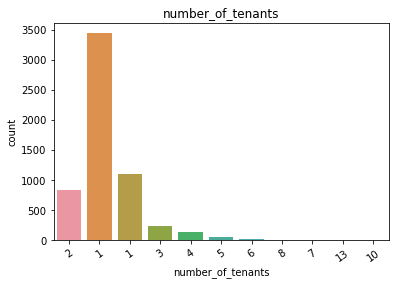

In [694]:
sns.countplot(x='number_of_tenants', data=buyouts_cleaned);
plt.title('number_of_tenants');
plt.xticks(rotation=35)
plt.show()

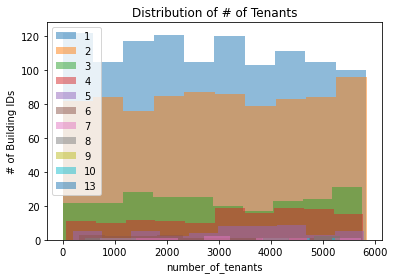

In [695]:
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='1'], alpha=.5, label='1');
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='2'], alpha=.5, label='2');
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='3'], alpha=.5, label='3');
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='4'], alpha=.5, label='4');
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='5'], alpha=.5, label='5');
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='6'], alpha=.5, label='6');
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='7'], alpha=.5, label='7');
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='8'], alpha=.5, label='8');
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='9'], alpha=.5, label='9');
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='10'], alpha=.5, label='10');
plt.hist('id', data=buyouts[buyouts['number_of_tenants'] =='13'], alpha=.5, label='13');
plt.title('Distribution of # of Tenants');
plt.xlabel('number_of_tenants');
plt.ylabel('# of Building IDs')
plt.legend()

count     5855
unique      11
top          1
freq      3445
Name: number_of_tenants, dtype: int64


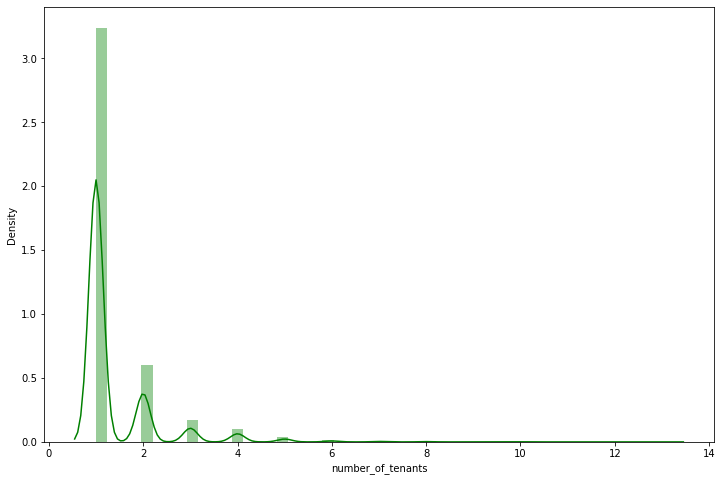

In [696]:
print(buyouts['number_of_tenants'].describe())
plt.figure(figsize=(12, 8))
sns.distplot(buyouts['number_of_tenants'], color='g', bins=50, hist_kws={'alpha': 0.4});

#### 58% of our tenant # data is missing, creating low confidence in our ability to rely on this value as a key indicator

In [697]:
buyouts_cleaned['id'].count()

5855

In [698]:
engine = sa.create_engine(conn_string, pool_timeout=60)
connection = engine.connect()
get_tables_query = """
select schema_name(t.schema_id) as schema_name,
       t.name as table_name,
       t.create_date,
       t.modify_date
from sys.tables t
order by schema_name,
         table_name;
"""

tables = pd.read_sql_query(get_tables_query, connection)
tables

,schema_name,table_name,create_date,modify_date
0,dbo,BR_Reason,2022-05-26 01:45:35.133,2022-05-26 01:59:52.133
1,dbo,BuildVersion,2022-05-15 20:04:00.113,2022-05-15 20:04:01.767
2,dbo,buyouts_group_renamed,2022-05-26 22:47:02.243,2022-05-26 22:47:02.243
3,dbo,Date,2022-05-26 01:44:54.340,2022-05-26 01:59:52.133
4,dbo,DIM_Date,2022-05-27 16:09:17.840,2022-05-27 16:09:17.840
5,dbo,DIM_Demographics,2022-05-26 01:59:27.683,2022-05-26 01:59:27.683
6,dbo,DIM_District,2022-05-26 01:55:06.617,2022-05-26 01:59:52.133
7,dbo,DIM_Eviction_Reason,2022-05-26 01:34:00.140,2022-05-26 01:45:35.137
8,dbo,ErrorLog,2022-05-15 20:04:00.113,2022-05-15 20:04:01.767
9,dbo,FACT_SanFrancisco,2022-05-26 01:59:52.130,2022-05-26 01:59:52.130


In [699]:
location_table_target_names = """
select 
    col.column_id as id,
    col.name,
    t.name as data_type,
    col.max_length,
    col.precision,
    col.is_nullable
from sys.tables as tab
    inner join sys.columns as col
        on tab.object_id = col.object_id
    left join sys.types as t
    on col.user_type_id = t.user_type_id
where tab.name = 'Rel_Location'
order by tab.name, column_id;
"""

location_table_fields = pd.read_sql_query(location_table_target_names, connection)
location_table_fields

,id,name,data_type,max_length,precision,is_nullable
0,1,location_id,uniqueidentifier,16,0,False
1,2,block_level_address,varchar,432,0,True
2,3,zipcode,int,4,10,False
3,6,city,varchar,13,0,True
4,7,state,varchar,2,0,True
5,8,supervisor_district,tinyint,1,3,False
6,20,demographic_id,uniqueidentifier,16,0,True
7,22,location,varchar,432,0,True
8,23,shape,varchar,432,0,True


In [700]:
buyouts_columns = ['id', 'number_of_tenants']
buyouts_grouped = buyouts_cleaned.groupby(buyouts_columns).count().reset_index()

In [701]:
buyouts_grouped = buyouts_grouped[buyouts_columns]

In [702]:
buyouts_grouped_renamed = buyouts_grouped.rename(columns={ 
    'id': 'building_id',
    'number_of_tenants': 'number_of_tenants',
})

In [703]:
buyouts_grouped_renamed

,building_id,number_of_tenants
0,0,2
1,1,1
2,2,1
3,3,1
4,4,1
5,5,1
6,6,1
7,7,1
8,8,1
9,9,2


In [704]:
buyouts_grouped_renamed.to_sql('Rel_building', con=engine, if_exists='append',
                                                      index=False)

In [705]:
engine = sa.create_engine(conn_string, pool_timeout=60)
connection = engine.connect()
query = """
SELECT *
FROM dbo.Rel_building
;
"""

rows = pd.read_sql_query(query, connection)

In [706]:
rows

,building_id,number_of_tenants
0,0,2
1,1,1
2,2,1
3,3,1
4,4,1
5,5,1
6,6,1
7,7,1
8,8,1
9,9,2
